In [1]:
import torch
import torch.nn as nn # 연산
import torch.nn.functional as F # 함수
import torch.optim as optim # optimization
import torchvision.transforms as transforms # image transforms
import torchvision.models as models # image model

import PIL # python image libray
import matplotlib.pyplot as plt # show image 

import copy

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # GPU 있으면 "cuda" 없으면 "cpu" 

In [3]:
# 이미지를 불러와 텐서로 변환하는 함수
def image_loader(img_path, imsize): # img_path: img경로, imsize: 이미지 크기
  loader = transforms.Compose([transforms.Resize(imsize), # 이미지 크기를 변경
                               transforms.ToTensor()]) # Tensor 형식으로 변경
  image = PIL.Image.open(img_path) # image Load
  image = loader(image).unsqueeze(0) # 이미지에서 batch를 고려해서 1인 차원 생성
  return image.to(device, torch.float) # GPU로 올리고 반환

def imshow(tensor):
  image = tensor.cpu().clone # GPU에서 CPU로 이동시키고 복제
  image = tensor.squeeze(0) # 1인 차원 제거
  image = transforms.ToPILImage()(image) # 이미지 출력을 위해 PIL 객체로 변경
  plt.imshow(image)
  plt.show()

In [4]:
!# 저장소의 소스코드를 다운로드하여 실습용 이미지 준비하기
!git clone https://github.com/ndb796/Deep-Learning-Paper-Review-and-Practice
%cd Deep-Learning-Paper-Review-and-Practice

Cloning into 'Deep-Learning-Paper-Review-and-Practice'...
remote: Enumerating objects: 462, done.
remote: Counting objects: 100% (201/201), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 462 (delta 72), reused 190 (delta 65), pack-reused 261
Receiving objects: 100% (462/462), 53.82 MiB | 24.81 MiB/s, done.
Resolving deltas: 100% (152/152), done.
/content/Deep-Learning-Paper-Review-and-Practice


### Image Reconstruction 실습하기


*   이미지를 최적화 특정 손실 값을 낮추는 방향으로 이미지 업데이트
*   MSE Loss 이용하여 노이즈 이미지를 특정 이미지로 변환





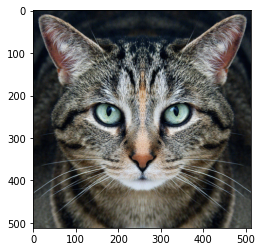

In [5]:
# 목표 이미지 불러오기(위에 정의한 함수 사용)
img_path = './code_practices/images/cat.jpg'
target_image = image_loader(img_path, (512, 512))
imshow(target_image)

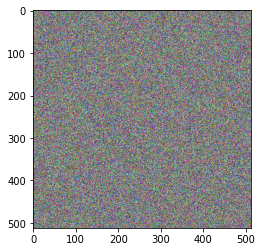

In [6]:
# 동일한 크기의 노이즈 이미지 생성하기
noise = torch.empty_like(target_image).uniform_(0,1).to(device) 
# empty_like(원하는 사이즈), uniform_(0,1) 0과 1 사이의 값을 랜덤하게 설정, gpu에서 학습하기 위해 gpu로 이동
imshow(noise)

Start


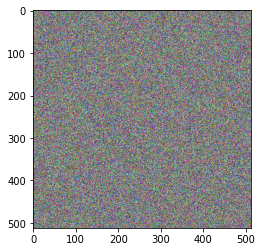

Step: 10
Loss: 0.10423865169286728


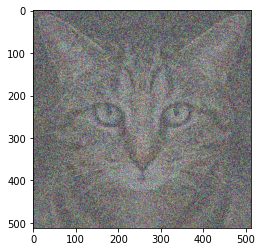

Step: 20
Loss: 0.06226985156536102


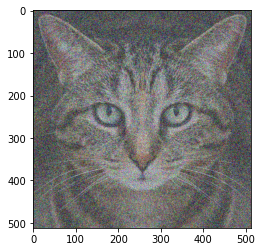

Step: 30
Loss: 0.03719862550497055


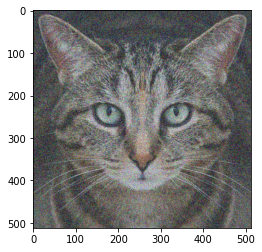

Step: 40
Loss: 0.022221630439162254


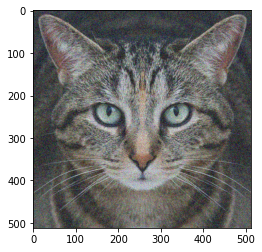

Step: 50
Loss: 0.013274706900119781


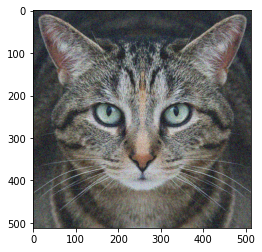

Step: 60
Loss: 0.007930015213787556


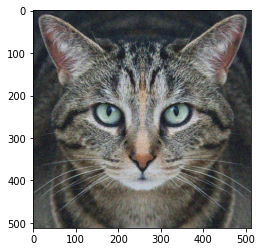

Step: 70
Loss: 0.004737214185297489


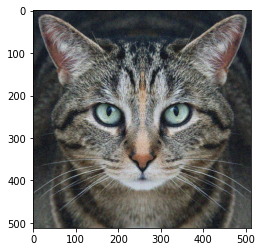

Step: 80
Loss: 0.0028299062978476286


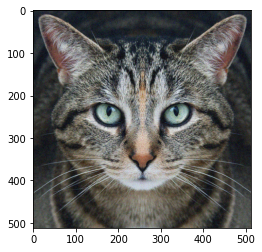

Step: 90
Loss: 0.0016905231168493629


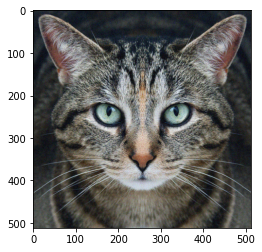

Step: 100
Loss: 0.0010098809143528342


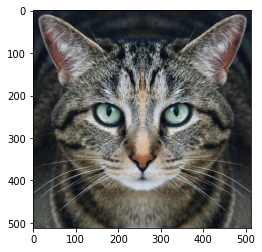

In [7]:
loss = nn.MSELoss() # mse 손실함수 정의
iters = 100 # 반복 횟수 설정
lr = 1e4 # learning rate

print("Start")
imshow(noise)

for i in range(iters):
  noise.requires_grad = True # required_grad = True로 설정하여 torh.Tensor의 연산을 추적

  output = loss(noise, target_image) # 손실함수 계산
  output.backward() # 손실함수 미분하여 기울기 계산

  gradient = lr * noise.grad # 계산된 noise에 관한 기울기에 lr 곱하여 크기 조정
  noise = torch.clamp(noise - gradient, min=0, max=1).detach()
  # 노이즈의 값이 (0,1) 값을 가지도록 자르기(torch.clamp)
  # detach(): 연산 추적 방지
  
  if (i+1) % 10 == 0:
    print(f'Step: {i+1}')
    print(f'Loss: {output}')
    imshow(noise)

실습을 위한 이미지 불러오기(content, style)

[ Content Image ]


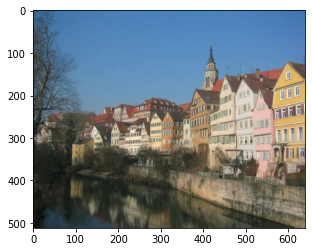

[ Style Image ]


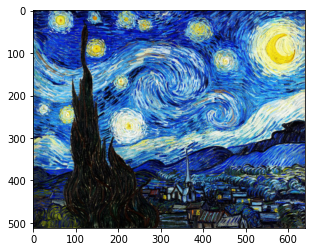

In [8]:
content_img = image_loader('./code_practices/images/content_img_1.jpg', (512, 640)) # 건물사진
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640)) # 반고흐 사진

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

CNN 네트워크 불러오기(VGGNet)

In [10]:
# 이미 학습된 model 불러오기
cnn = models.vgg19(pretrained = True).features.eval().to(device) # 이미 학습된 vgg19 model의 feature만 불러오기(분류가 아니라 feature만 사용)
#gpu로 이동하고 학습이 아닌 test 목적으로 이용하므로 eval()
print(cnn)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [11]:
# 입력 이미지의를 정규화 하기위한 초기화
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device) #평균
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device) #표준편차

class Normalization(nn.Module):
  def __init__(self, mean, std):
    super(Normalization, self).__init__()
    self.mean = mean.clone().view(-1,1,1) # mean reshape
    self.std = std.clone().view(-1,1,1) # std reshape
  
  def forward(self, img):
    return (img - self.mean)/self.std

Style Reconstruction


*   임의의 noise가 특정 이미지의 style을 갖도록 변환
*   style_layers 리스트 변수의 값을 조절하여 어떤 레이어를 이용할지 설정한다



In [12]:
# gram matrix 계산
def gram_matrix(input):
  a, b, c, d = input.size() # a: batch size b: number of feature map (c,d) dimension
  features = input.view(a*b, c*d) # (i, j) i = a * b j = c * d
  G = torch.mm(features, features.t()) # Gram matrix

  return G.div(a*b*c*d) # Normalize 

# style loss 계산
class StyleLoss(nn.Module):
  def __init__(self, target_features):
    super(StyleLoss, self).__init__()
    self.target = gram_matrix(target_features).detach()

  def forward(self, input):
    G = gram_matrix(input)
    self.loss = F.mse_loss(G, self.target)
    return input # styleloss layer로 사용하므로 input을 반환해야 다음 layer에서 사용 가능

In [20]:
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

#style loss 계산

def get_style_losses(cnn, style_img, noise_image):
  cnn = copy.deepcopy(cnn) # get vgg model
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device) # Normalize
  style_losses = [] # initialize
  # 제일 처음에 image normalization
  model = nn.Sequential(normalization)
  # 모든 layer 확인과 저장
  i = 0
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d):
      i += 1 # conv layer을 만날때마다 i + 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      layer = nn.ReLU(inplace =False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.foramt(i)
    else:
      raise RuntimeError("Unrecognized layer: {}". format(layer.__class__.__name__))
    
    model.add_module(name, layer) # layer 추가

    # 설정한 style_layer까지의 결과를 이용해 style_loss 계산
    if name in style_layers:
      target_feature = model(style_img).detach() # 중간에 conv layer 마다 styleloss 계산
      style_loss = StyleLoss(target_feature) # styleloss layer 생성
      model.add_module("style_loss_{}".format(i), style_loss) # conv layer을 통과할때마다 style loss를 구하는 layer을 추가한다
      style_losses.append(style_loss) # 각 conv layer feature 마다 stytle loss 저장
  
  # 마지막 style loss 이후의 레이어는 사용 안하도록
  for i in range(len(model)-1,-1,-1):
    if isinstance(model[i], StyleLoss):
      break
  
  model = model[:(i+1)]
  print(model)
  return model, style_losses


In [21]:
def style_reconstruction(cnn, style_img, input_img, iters):
  model, style_losses = get_style_losses(cnn, style_img, input_img)
  optimizer = optim.LBFGS([input_img.requires_grad_()])

  print("Start")
  imshow(input_img)

  run = [0]
  while run[0] <= iters:
    def closure():
      input_img.data.clamp_(0,1) # 이미지의 픽셀 값 범위 한정

      optimizer.zero_grad() # 기울기 초기화
      model(input_img) # 모델에 image 입력
      style_score = 0

      for sl in style_losses:
        style_score +=sl.loss # score update
      
      style_score *= 1e6 # value normalize
      style_score.backward() # gradient computation
      run[0]+=1 # number of iterations
      if run[0] % 50 ==0:
          print(f"[ Step: {run[0]} / Style loss: {style_score.item()}]")
          imshow(input_img) # plot image
      
      return style_score # return score
  
    optimizer.step(closure) # update image

# 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
  input_img.data.clamp_(0, 1)

  return input_img # 결과 이미지

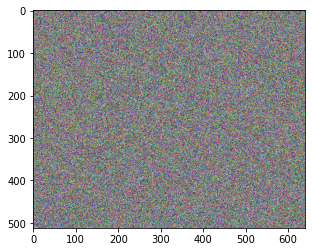

In [22]:
input_img = torch.empty_like(content_img).uniform_(0,1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_1): StyleLoss()
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_2): StyleLoss()
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_3): StyleLoss()
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_4): StyleLoss()
  (relu_4): ReLU()
  (pool_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (style_loss_5): StyleLoss()
)
Start


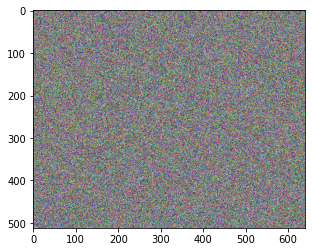

[ Step: 50 / Style loss: 423.0208435058594]


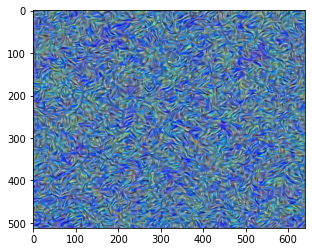

[ Step: 100 / Style loss: 108.41609191894531]


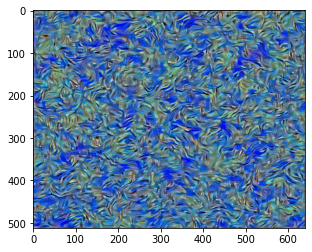

[ Step: 150 / Style loss: 51.064239501953125]


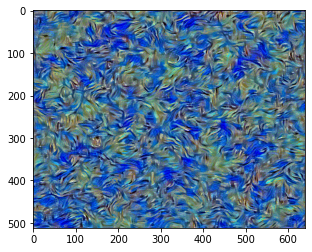

[ Step: 200 / Style loss: 36.24882888793945]


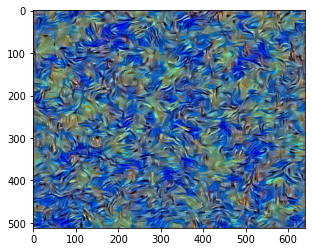

[ Step: 250 / Style loss: 29.037702560424805]


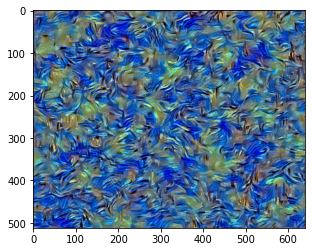

[ Step: 300 / Style loss: 23.86981773376465]


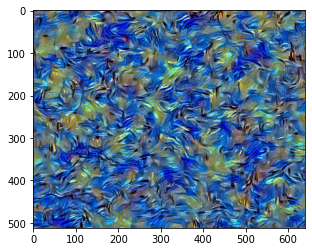

In [23]:
output = style_reconstruction(cnn, style_img, input_img, iters =300)

Content Reconstructioin

*   임의의 noise가 content를 가지도록 변환

In [75]:
# content loss 계산을 위한 class 정의
class ContentLoss(nn.Module):
  def __init__(self,target):
    super(ContentLoss, self).__init__()
    self.target = target.detach()
  
  def forward(self, input):
    self.loss = F.mse_loss(self.target, input) # mse loss (단순히 값만 비교)
    return input

In [80]:
# content loss layer 찾기
content_layers = ['conv_4']

# content loss compuation function
def get_content_losses(cnn, content_img, noise_image):
  cnn = copy.deepcopy(cnn)
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
  content_losses =[]

  #가장 먼저 입력받는 이미지가 입력 정규화 수행
  model = nn.Sequential(normalization)

  #현재 CNN 모델에 포함되어 있는 모든 레이어를 확인
  i = 0
  for layer in cnn.children():
    if isinstance(layer, nn.Conv2d):
      i += 1
      name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
      name = 'relu_{}'.format(i)
      layer = nn.ReLU(inplace =False)
    elif isinstance(layer, nn.MaxPool2d):
      name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
      name = 'bn_{}'.format(i)
    else:
      raise RuntimeError('Unrecognized layer:{}'.format(layer.__class__.__name__))
    
    model.add_module(name, layer)

    # 설정한 content layer까지의 결과를 이용해 content loss 계산
    if name in content_layers:
      target_feature = model(content_img).detach()
      content_loss = ContentLoss(target_feature)
      model.add_module('content_loss_{}'.format(i), content_loss)
      content_losses.append(content_loss)
    
    #마지막 content loss 이후에 레이어 더이상 사용 안하도록 설정
  for i in range(len(model)-1,-1,-1):
    if isinstance(model[i], ContentLoss):
      break
  
  model = model[:(i+1)]
  print(model)
  return model, content_losses

In [83]:
# content reconstruction function
def content_reconstruction(cnn, content_img, input_img, iters):
  model, content_losses = get_content_losses(cnn, content_img, input_img)
  optimizer = optim.LBFGS([input_img.requires_grad_()]) # noise image requires gradient for update
  
  print("start")
  imshow(input_img)

  #하나의 값을 이용하기 위해 배열 이용
  run = [0]
  while run[0] <= iters:

    def closure():
      input_img.data.clamp_(0,1) # 이미지 픽셀값 자르기

      optimizer.zero_grad() # 기울기 초기화
      model(input_img) # 입력
      content_score =0
      for cl in content_losses:
        content_score += cl.loss # loss합
      
      content_score.backward() # gradient compuation

      run[0]+=1
      if run[0] % 50 == 0:
        print(f"Step:{run[0]} / Content loss: {content_score.item()}")
        imshow(input_img)
      
      return content_score
    
    optimizer.step(closure) # update input img

  input_img.data.clamp_(0, 1)
  return input_img

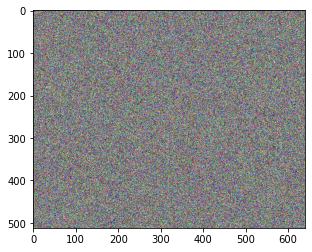

In [86]:
input_img = torch.empty_like(content_img).uniform_(0,1).to(device)
imshow(input_img)

Sequential(
  (0): Normalization()
  (conv_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_2): ReLU()
  (pool_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU()
  (conv_4): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (content_loss_4): ContentLoss()
)
start


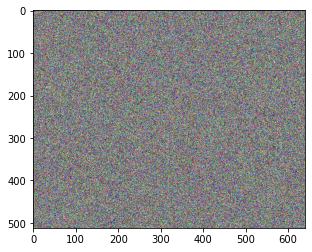

Step:50 / Content loss: 0.7448087334632874


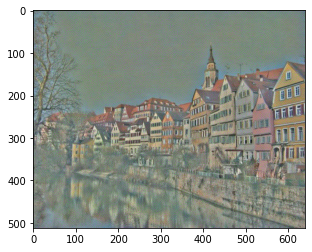

Step:100 / Content loss: 0.3720692992210388


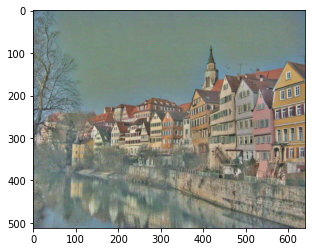

Step:150 / Content loss: 0.24119828641414642


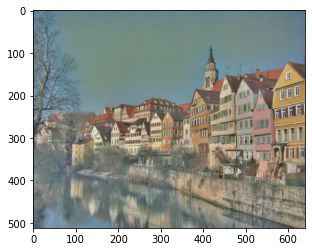

Step:200 / Content loss: 0.17332148551940918


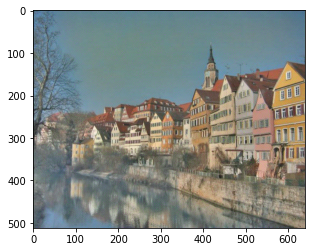

Step:250 / Content loss: 0.1319947987794876


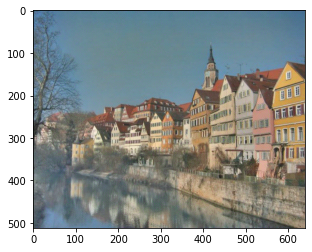

Step:300 / Content loss: 0.10234493017196655


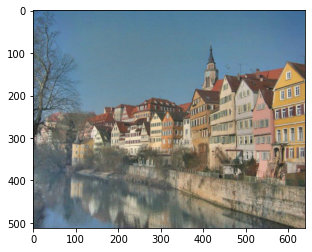

In [87]:
#content reconstruction execution
output = content_reconstruction(cnn, content_img, input_img, iters =300)

Style Transfer 실습

*   Content Loss와 Style Loss 함께 적용



In [88]:
content_layers = ['conv_4'] # content feature get
style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_9'] # style feature get

# Style Transfer 손실(loss)을 계산하는 함수
def get_losses(cnn, content_img, style_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    style_losses = []
    
    # 가장 먼저 입력 이미지가 입력 정규화(input normalization)를 수행하도록
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        # 설정한 content layer까지의 결과를 이용해 content loss를 계산
        if name in content_layers: # get content loss
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        # 설정한 style layer까지의 결과를 이용해 style loss를 계산
        if name in style_layers: # get style loss
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # 마지막 loss 이후의 레이어는 사용하지 않도록
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, content_losses, style_losses

In [89]:
def style_transfer(cnn, content_img, style_img, input_img, iters):
    model, content_losses, style_losses = get_losses(cnn, content_img, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            content_score = 0
            style_score = 0

            for cl in content_losses:
                content_score += cl.loss
            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e5
            loss = content_score + style_score  #style loss + content loss 최소화 하는 방향으로 학습
            loss.backward()

            run[0] += 1
            if run[0] % 100 == 0:
                print(f"[ Step: {run[0]} / Content loss: {content_score.item()} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return content_score + style_score
        
        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img

[ Content Image ]


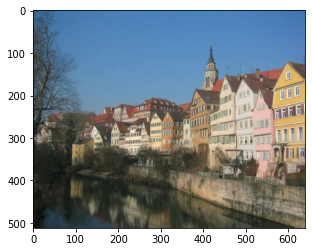

[ Style Image ]


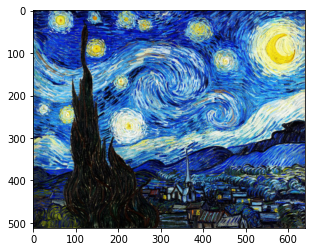

In [90]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비
content_img = image_loader('./code_practices/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

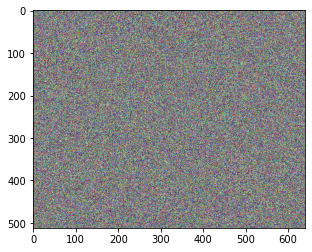

In [91]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

In [92]:
# style transfer 수행
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

Output hidden; open in https://colab.research.google.com to view.

In [93]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_1.png')
print('이미지 파일 저장을 완료했습니다.')

이미지 파일 저장을 완료했습니다.


In [94]:
from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_1.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

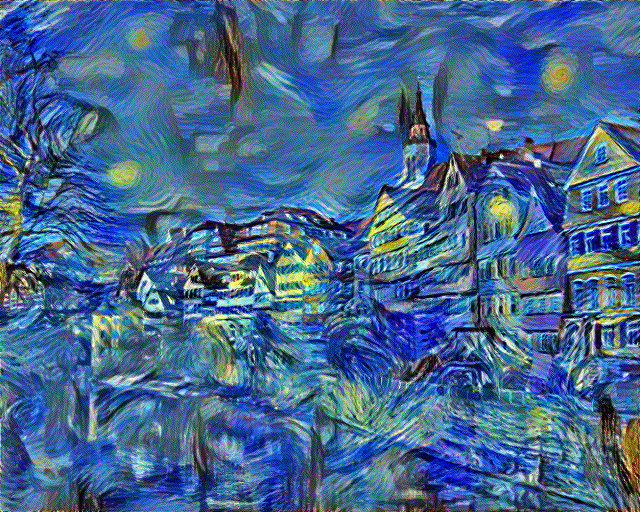

In [95]:
from IPython.display import Image

Image('output_1.png')

[ Content Image ]


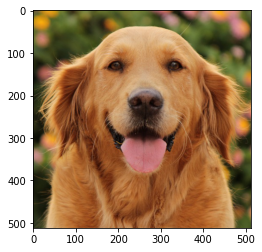

[ Style Image ]


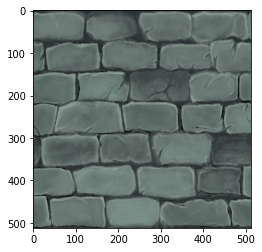

In [96]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/content_img_2.jpg', (512, 512))
style_img = image_loader('./code_practices/images/style_img_2.jpg', (512, 512))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

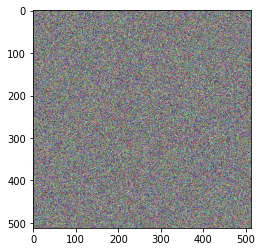

[ Start ]


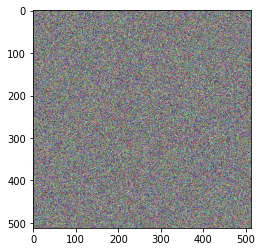

[ Step: 100 / Content loss: 12.280998229980469 / Style loss: 9.001911163330078]


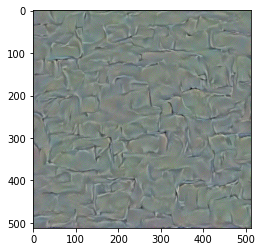

[ Step: 200 / Content loss: 8.764017105102539 / Style loss: 3.384481191635132]


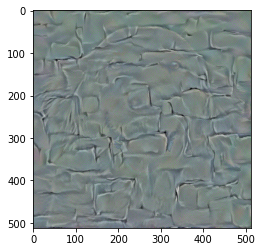

[ Step: 300 / Content loss: 6.870591163635254 / Style loss: 2.1826605796813965]


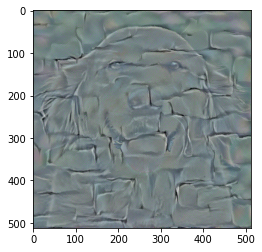

[ Step: 400 / Content loss: 5.775571823120117 / Style loss: 1.6753312349319458]


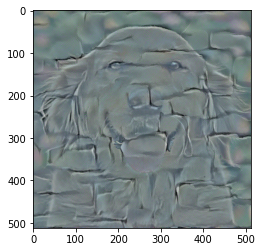

[ Step: 500 / Content loss: 5.085762977600098 / Style loss: 1.3867301940917969]


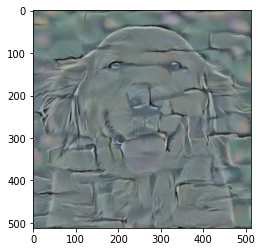

[ Step: 600 / Content loss: 4.656940460205078 / Style loss: 1.20623779296875]


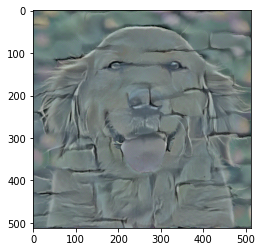

[ Step: 700 / Content loss: 4.36065673828125 / Style loss: 1.0706051588058472]


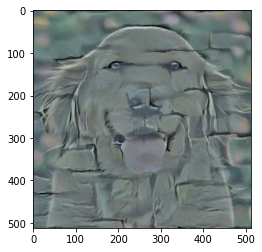

[ Step: 800 / Content loss: 4.158251762390137 / Style loss: 0.9761313796043396]


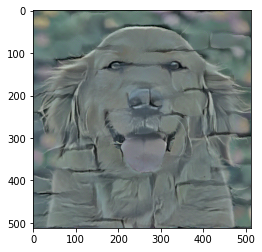

In [97]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=800)

예시 3

[ Content Image ]


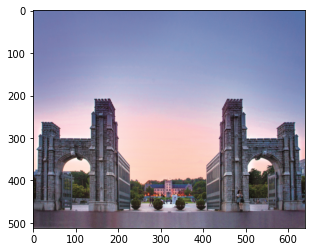

[ Style Image ]


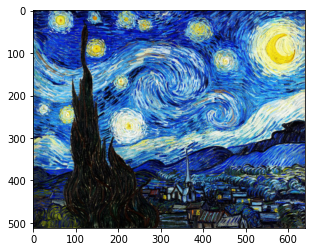

In [98]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/korea_university.jpg', (512, 640))
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

In [100]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

Output hidden; open in https://colab.research.google.com to view.

In [101]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_2.png')

from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_2.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[ Content Image ]


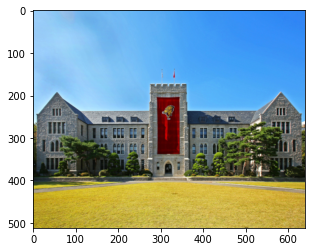

[ Style Image ]


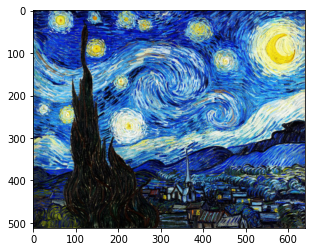

In [102]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/korea_university2.jpg', (512, 640))
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

In [103]:
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

Output hidden; open in https://colab.research.google.com to view.

In [104]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_3.png')

from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_3.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>